In [1]:
import os

from ultralytics import YOLO

In [10]:
ROOT_DIR = r"C:\Users\77019\Desktop\kbtu\5 sem\tic_tac_toe_cv\data"

In [21]:
import albumentations as A
import cv2
import os

# Define augmentations with YOLO bounding box format
transform = A.Compose([
    # A.RandomScale(scale_limit=0.2, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    # A.RandomBrightnessContrast(p=0.2),
    # A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    # A.Normalize()
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))


import numpy as np

def load_yolo_labels(label_path):
    with open(label_path, 'r') as file:
        labels = [line.strip().split() for line in file.readlines()]
        # Convert to float
        labels = [[int(label[0])] + list(map(float, label[1:])) for label in labels]
    return labels

def save_yolo_labels(label_path, labels):
    with open(label_path, 'w') as file:
        for label in labels:
            file.write(f"{int(label[0])} " + " ".join(map(str, label[1:])) + "\n")

images_path = os.path.join(ROOT_DIR, "images/train")
labels_path = os.path.join(ROOT_DIR, "labels/train")

for img_filename in os.listdir(images_path):
    img_path = os.path.join(images_path, img_filename)
    label_path = os.path.join(labels_path, img_filename.replace('.jpg', '.txt'))

    # Load image and labels
    image = cv2.imread(img_path)
    bboxes = load_yolo_labels(label_path)
    bboxes = [[box[0], *box[1:]] for box in bboxes]  # Ensure YOLO format

    # Apply augmentations
    transformed = transform(image=image, bboxes=[box[1:] for box in bboxes], class_labels=[box[0] for box in bboxes])
    transformed_image = transformed['image']
    transformed_bboxes = transformed['bboxes']
    transformed_class_labels = transformed['class_labels']

    # Combine labels and save augmented image and labels
    transformed_labels = [[transformed_class_labels[i]] + list(transformed_bboxes[i]) for i in range(len(transformed_bboxes))]

    # Save augmented image
    aug_img_path = os.path.join("../data/images/augmented_train", img_filename)
    cv2.imwrite(aug_img_path, transformed_image)

    # Save updated labels
    aug_label_path = os.path.join("../data/labels/augmented_train", img_filename.replace('.jpg', '.txt'))
    save_yolo_labels(aug_label_path, transformed_labels)


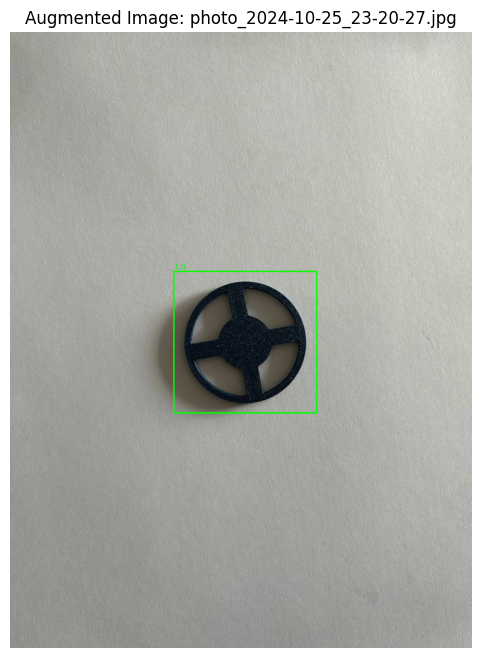

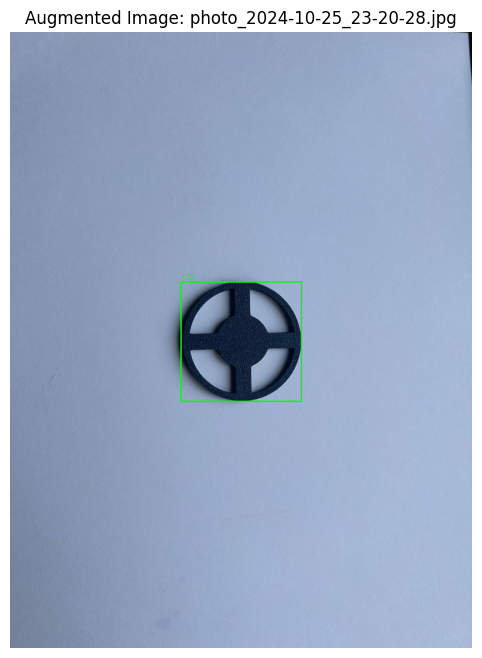

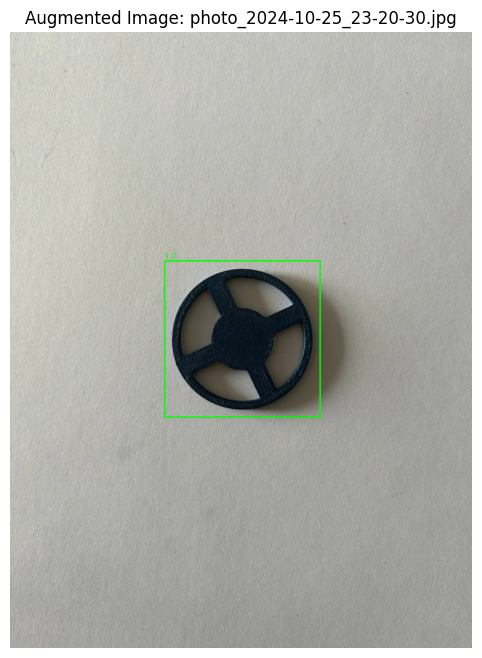

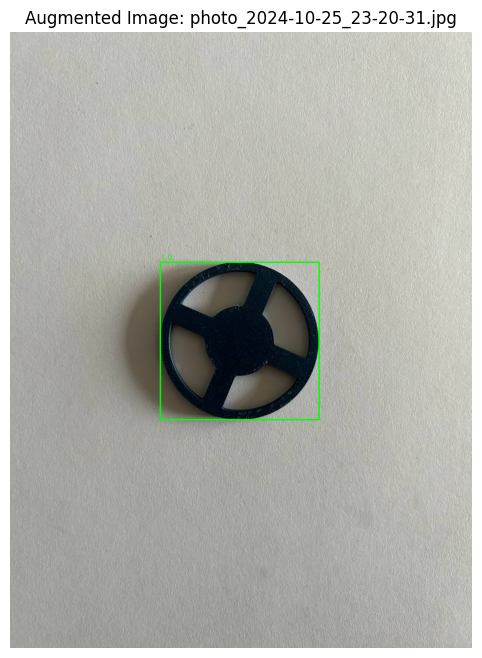

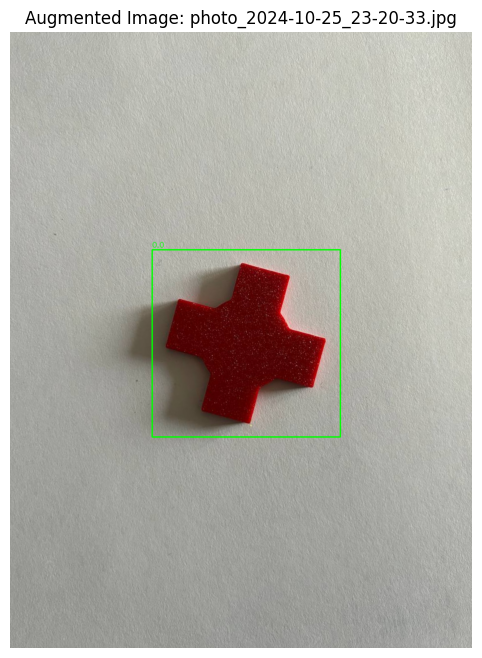

...

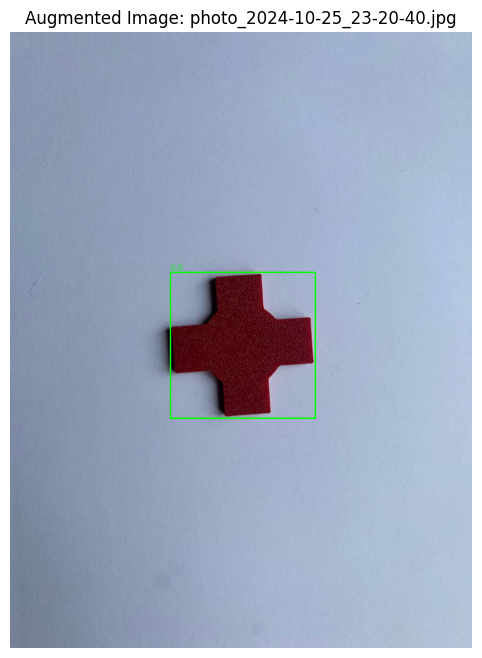

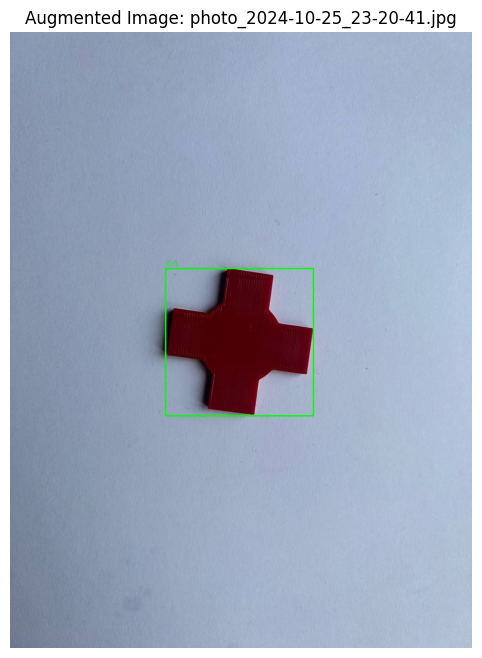

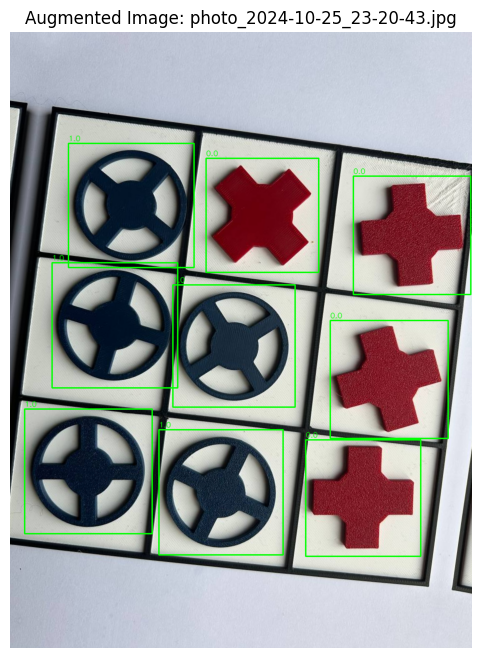

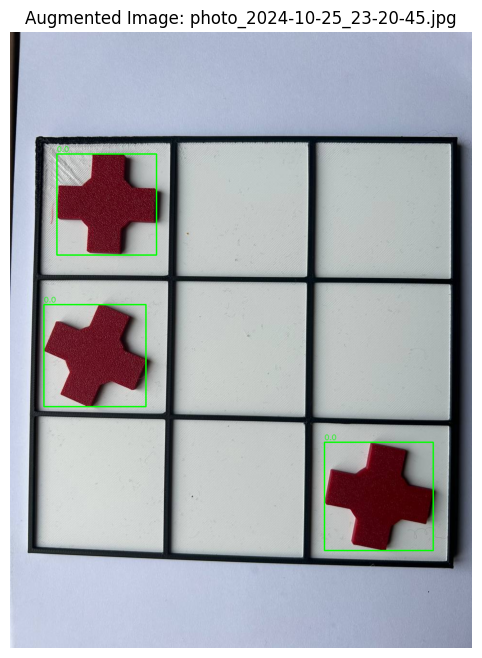

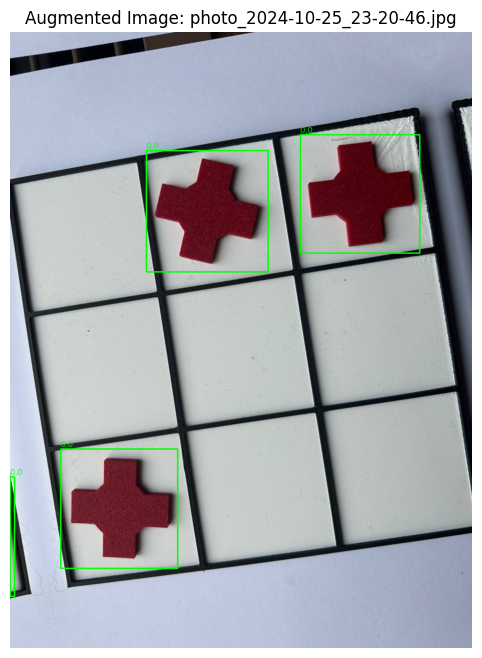

In [22]:
import matplotlib.pyplot as plt

def draw_bboxes(image, bboxes, class_labels=None, color=(0, 255, 0), thickness=2):
    """Draw bounding boxes on the image."""
    img = image.copy()
    h, w, _ = img.shape
    
    for i, bbox in enumerate(bboxes):
        x_center, y_center, width, height = bbox
        # Convert YOLO format to pixel values
        x1 = int((x_center - width / 2) * w)
        y1 = int((y_center - height / 2) * h)
        x2 = int((x_center + width / 2) * w)
        y2 = int((y_center + height / 2) * h)

        # Draw rectangle and optional label
        cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)
        if class_labels:
            cv2.putText(img, f"{class_labels[i]}", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)
    return img

# Visualize each augmented image with bounding boxes
for img_filename in os.listdir(images_path):
    img_path = os.path.join(images_path, img_filename)
    label_path = os.path.join(labels_path, img_filename.replace('.jpg', '.txt'))

    # Load image and labels
    image = cv2.imread(img_path)
    bboxes = load_yolo_labels(label_path)
    bboxes = [[box[0], *box[1:]] for box in bboxes]  # Ensure YOLO format

    # Apply augmentations
    transformed = transform(image=image, bboxes=[box[1:] for box in bboxes], class_labels=[box[0] for box in bboxes])
    transformed_image = transformed['image']
    transformed_bboxes = transformed['bboxes']
    transformed_class_labels = transformed['class_labels']

    # Draw bounding boxes on transformed image
    transformed_image_with_bboxes = draw_bboxes(transformed_image, transformed_bboxes, transformed_class_labels)

    # Display the augmented image
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(transformed_image_with_bboxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Augmented Image: {img_filename}")
    plt.show()

    # Optional: Save image with drawn bounding boxes for record-keeping
    debug_img_path = os.path.join("../data/images/debug_augmented_train", img_filename)
    cv2.imwrite(debug_img_path, transformed_image_with_bboxes)



Image: photo_2024-10-25_23-20-27.jpg
Original BBoxes: [[0.49175, 0.504883, 0.265479, 0.196344]]
Transformed BBoxes: [[0.5082499980926514, 0.5048829913139343, 0.2654789686203003, 0.1963440179824829]]


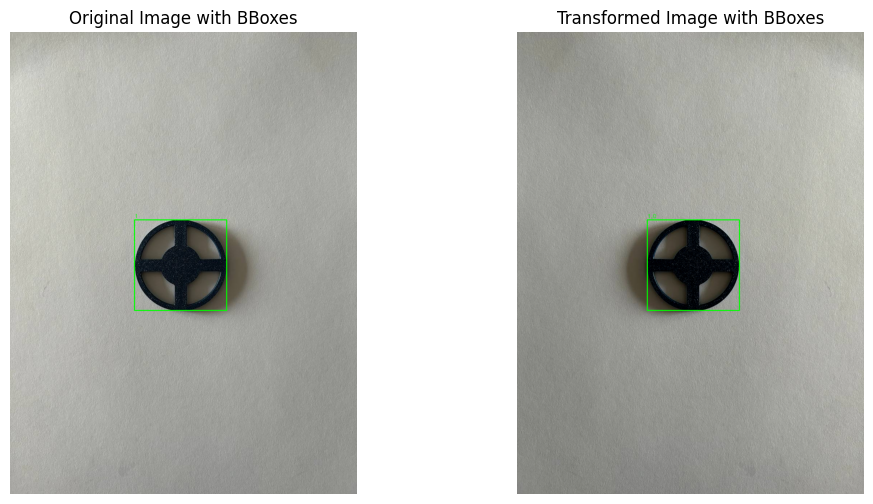


Image: photo_2024-10-25_23-20-28.jpg
Original BBoxes: [[0.500313, 0.50259, 0.260583, 0.193602]]
Transformed BBoxes: [[0.5003129839897156, 0.502590000629425, 0.2605830430984497, 0.19360196590423584]]


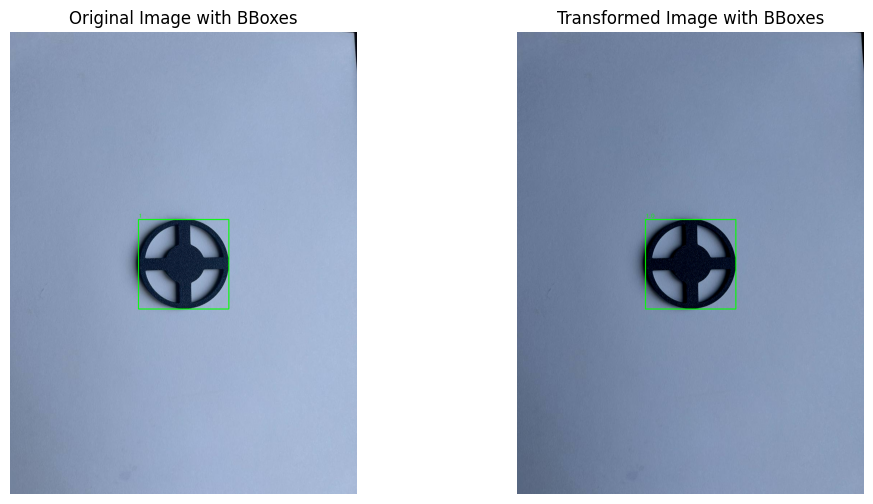


Image: photo_2024-10-25_23-20-30.jpg
Original BBoxes: [[0.50276, 0.498457, 0.304625, 0.229383]]
Transformed BBoxes: [[0.49724000692367554, 0.49845701456069946, 0.3046250343322754, 0.22938299179077148]]


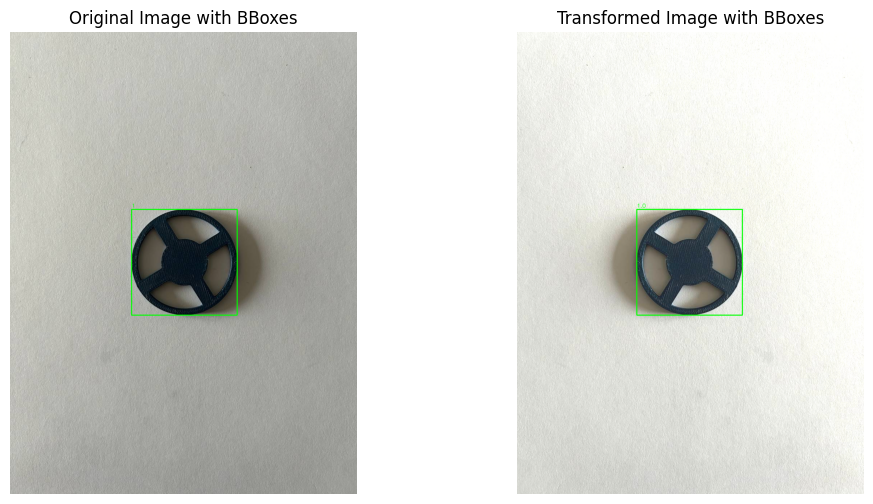


Image: photo_2024-10-25_23-20-31.jpg
Original BBoxes: [[0.50276, 0.501672, 0.343771, 0.255984]]
Transformed BBoxes: [[0.5027599930763245, 0.5016720294952393, 0.34377098083496094, 0.25598403811454773]]


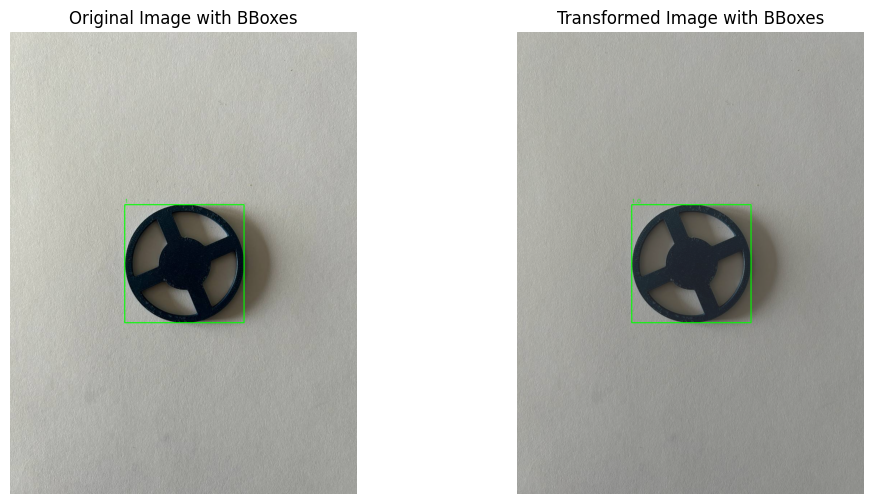


Image: photo_2024-10-25_23-20-33.jpg
Original BBoxes: [[0.489917, 0.506715, 0.347438, 0.258742]]
Transformed BBoxes: [[0.48991701006889343, 0.5067149996757507, 0.3474380373954773, 0.25874197483062744]]


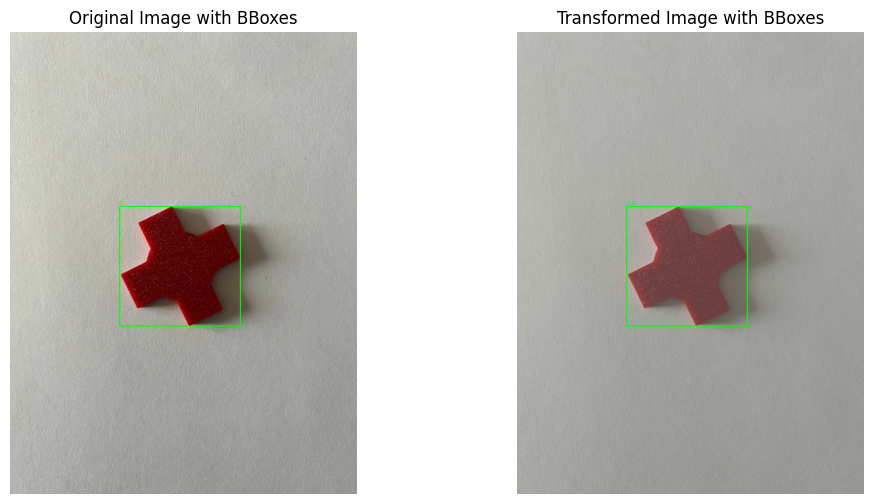


Image: photo_2024-10-25_23-20-34.jpg
Original BBoxes: [[0.492974, 0.496625, 0.33399, 0.251406]]
Transformed BBoxes: [[0.507025957107544, 0.49662500619888306, 0.33399003744125366, 0.2514060437679291]]


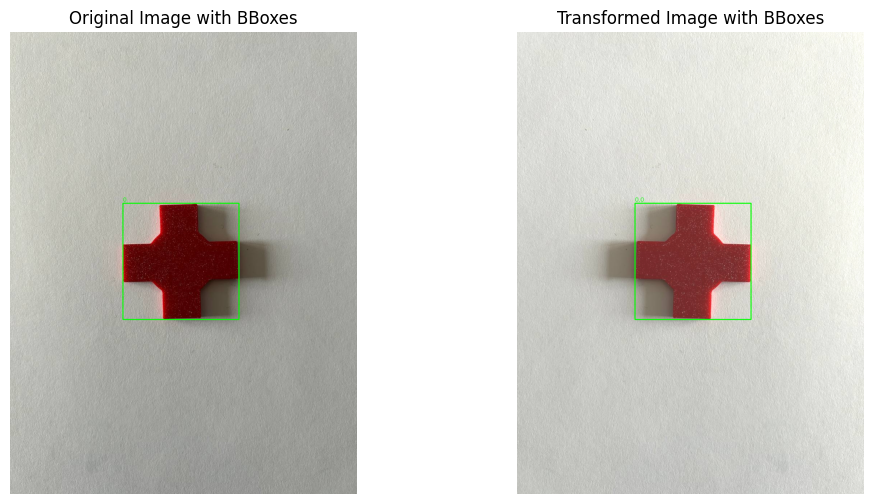


Image: photo_2024-10-25_23-20-36.jpg
Original BBoxes: [[0.485021, 0.496625, 0.359667, 0.26975]]
Transformed BBoxes: [[0.4850209951400757, 0.49662500619888306, 0.359667032957077, 0.2697499990463257]]


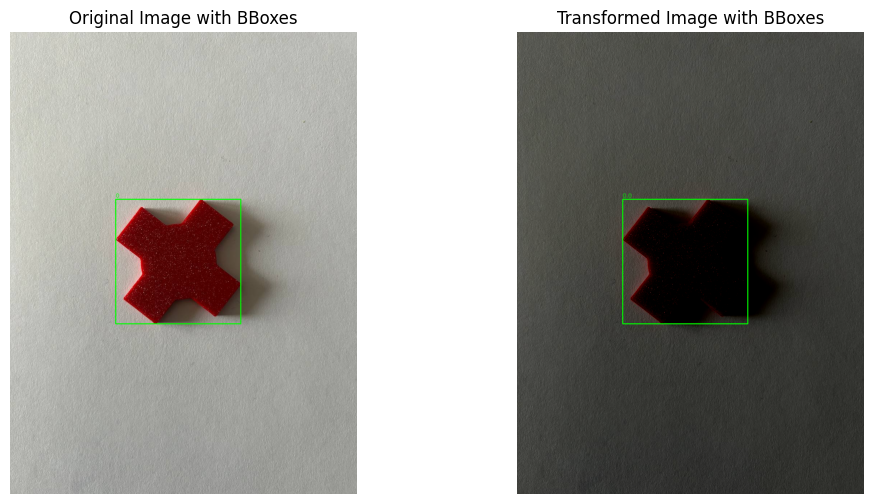


Image: photo_2024-10-25_23-20-38.jpg
Original BBoxes: [[0.497266, 0.500297, 0.288698, 0.214703]]
Transformed BBoxes: [[0.4972659945487976, 0.5002970099449158, 0.2886979579925537, 0.21470296382904053]]


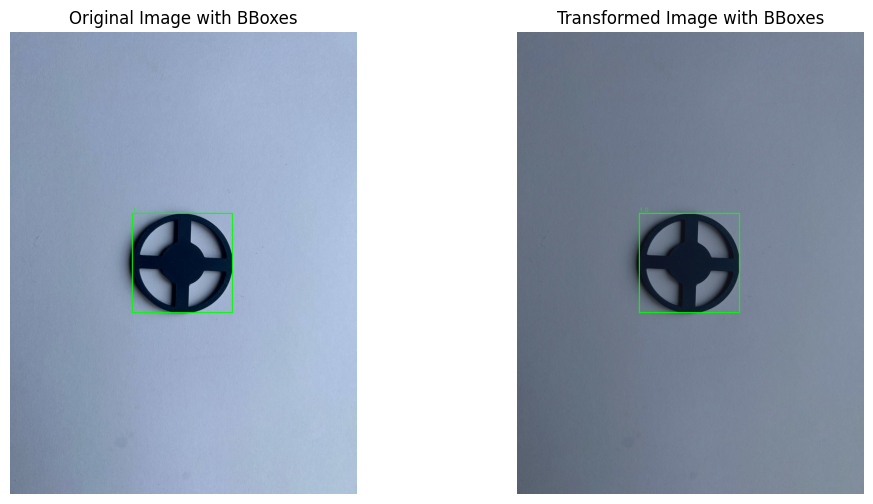


Image: photo_2024-10-25_23-20-40.jpg
Original BBoxes: [[0.503984, 0.509012, 0.299719, 0.226633]]
Transformed BBoxes: [[0.5039839744567871, 0.50901198387146, 0.299718976020813, 0.2266329824924469]]


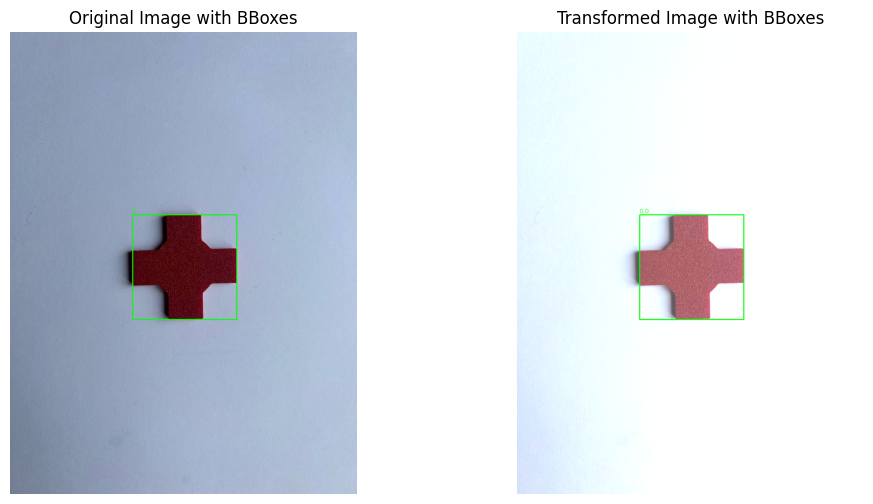


Image: photo_2024-10-25_23-20-41.jpg
Original BBoxes: [[0.496641, 0.503496, 0.319302, 0.239492]]
Transformed BBoxes: [[0.5033589601516724, 0.503495991230011, 0.3193020224571228, 0.2394920289516449]]


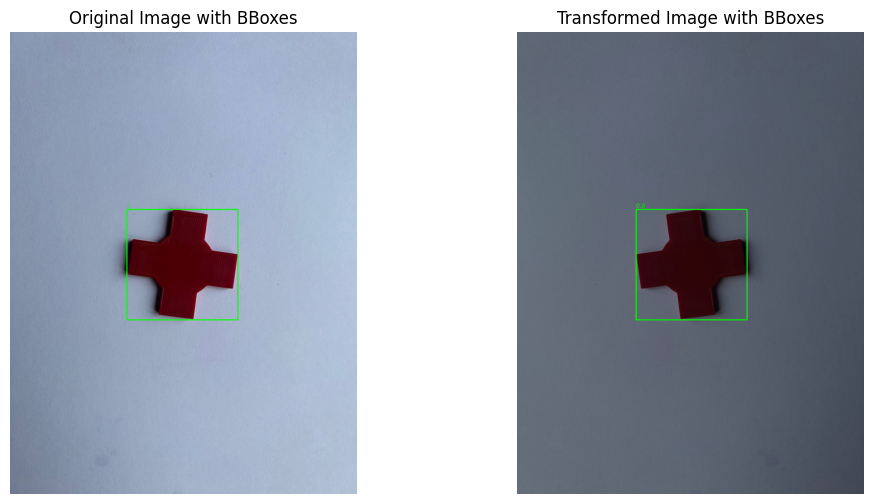


Image: photo_2024-10-25_23-20-43.jpg
Original BBoxes: [[0.829234, 0.531168, 0.227344, 0.170508], [0.807833, 0.727828, 0.221229, 0.168219], [0.836375, 0.294371, 0.225313, 0.171273], [0.509635, 0.295063, 0.216125, 0.165156], [0.225708, 0.307332, 0.241625, 0.178836], [0.224891, 0.50391, 0.241615, 0.180523], [0.486896, 0.511211, 0.2355, 0.176625], [0.501682, 0.749312, 0.238552, 0.180453], [0.21113, 0.744727, 0.246719, 0.178922]]
Transformed BBoxes: [[0.17076599597930908, 0.5311679840087891, 0.22734403610229492, 0.1705080270767212], [0.1921669840812683, 0.7278280258178711, 0.2212289571762085, 0.1682189702987671], [0.16362500190734863, 0.29437100887298584, 0.2253129482269287, 0.17127299308776855], [0.49036502838134766, 0.29506298899650574, 0.2161250114440918, 0.16515600681304932], [0.7742919921875, 0.30733200907707214, 0.24162501096725464, 0.17883598804473877], [0.7751089930534363, 0.5039100050926208, 0.2416149377822876, 0.18052300810813904], [0.5131039619445801, 0.5112109780311584, 0.23550

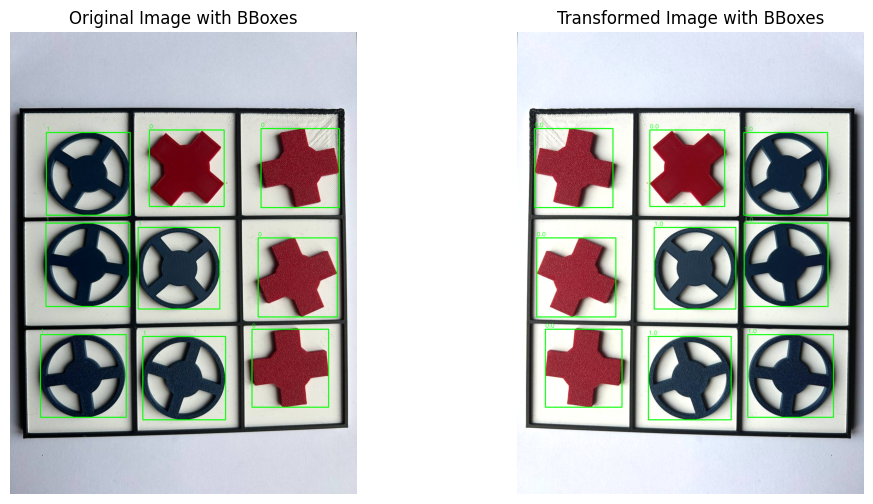


Image: photo_2024-10-25_23-20-45.jpg
Original BBoxes: [[0.201464, 0.753859, 0.236177, 0.175859], [0.81612, 0.525117, 0.220031, 0.165672], [0.790594, 0.280125, 0.214854, 0.16375]]
Transformed BBoxes: [[0.7985360026359558, 0.7538589835166931, 0.2361769676208496, 0.1758589744567871], [0.18387997150421143, 0.5251169800758362, 0.2200310230255127, 0.16567197442054749], [0.2094060182571411, 0.2801249921321869, 0.21485400199890137, 0.16374999284744263]]


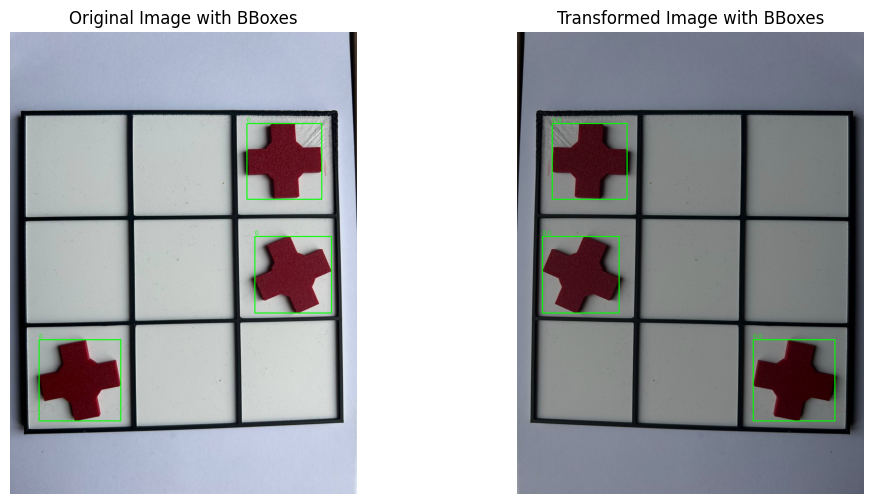


Image: photo_2024-10-25_23-20-46.jpg
Original BBoxes: [[0.193224, 0.298984, 0.224281, 0.166297], [0.524974, 0.284648, 0.228531, 0.170766], [0.82088, 0.736832, 0.218052, 0.168852]]
Transformed BBoxes: [[0.1932239979505539, 0.29898399114608765, 0.22428098320960999, 0.16629701852798462], [0.52497398853302, 0.28464800119400024, 0.22853100299835205, 0.17076599597930908], [0.8208799958229065, 0.7368320226669312, 0.21805202960968018, 0.16885197162628174]]


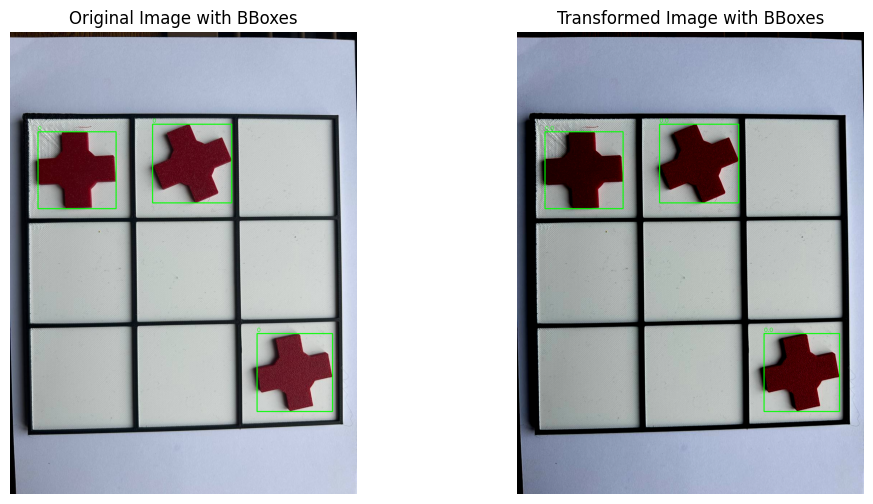

In [41]:
import albumentations as A
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

# Define augmentations with YOLO bounding box format
transform = A.Compose([
    # A.RandomScale(scale_limit=0.2, p=0.5),
    A.HorizontalFlip(p=0.5),
    # A.SafeRotate(limit=10, p=0.5),
    A.RandomBrightnessContrast(always_apply=True, brightness_limit=(-0.3, 0.5), contrast_limit=(-0.5, 0.5)),
    # Additional augmentations like scaling or brightness can be tested individually
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'], check_each_transform=True))

def load_yolo_labels(label_path):
    """Load YOLO format labels from a file."""
    with open(label_path, 'r') as file:
        labels = [line.strip().split() for line in file.readlines()]
        labels = [[int(label[0])] + list(map(float, label[1:])) for label in labels]
    return labels

def save_yolo_labels(label_path, labels):
    """Save YOLO format labels to a file."""
    with open(label_path, 'w') as file:
        for label in labels:
            file.write(f"{int(label[0])} " + " ".join(map(str, label[1:])) + "\n")

def draw_bboxes(image, bboxes, class_labels=None, color=(0, 255, 0), thickness=2):
    """Draw bounding boxes on the image with given class labels."""
    img = image.copy()
    h, w, _ = img.shape
    
    for i, bbox in enumerate(bboxes):
        x_center, y_center, width, height = bbox
        # Convert YOLO format to pixel values
        x1 = int((x_center - width / 2) * w)
        y1 = int((y_center - height / 2) * h)
        x2 = int((x_center + width / 2) * w)
        y2 = int((y_center + height / 2) * h)

        # Draw rectangle and optional label
        cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)
        if class_labels:
            cv2.putText(img, f"{class_labels[i]}", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)
    return img

# Paths to images and labels
images_path = os.path.join("../data/images/train")
labels_path = os.path.join("../data/labels/train")

for img_filename in os.listdir(images_path):
    img_path = os.path.join(images_path, img_filename)
    label_path = os.path.join(labels_path, img_filename.replace('.jpg', '.txt'))

    # Load image and labels
    image = cv2.imread(img_path)
    bboxes = load_yolo_labels(label_path)
    bboxes = [[box[0], *box[1:]] for box in bboxes]  # Ensure YOLO format

    # Original image with bounding boxes for comparison
    original_image_with_bboxes = draw_bboxes(image, [box[1:] for box in bboxes], [box[0] for box in bboxes])

    # Apply augmentations
    transformed = transform(image=image, bboxes=[box[1:] for box in bboxes], class_labels=[box[0] for box in bboxes])
    transformed_image = transformed['image']
    transformed_bboxes = transformed['bboxes']
    transformed_class_labels = transformed['class_labels']

    # Print original and transformed bounding boxes for comparison
    print(f"\nImage: {img_filename}")
    print("Original BBoxes:", [box[1:] for box in bboxes])
    print("Transformed BBoxes:", transformed_bboxes)

    # Draw bounding boxes on transformed image for visual inspection
    transformed_image_with_bboxes = draw_bboxes(transformed_image, transformed_bboxes, transformed_class_labels)

    # Display both original and augmented images with bounding boxes
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(cv2.cvtColor(original_image_with_bboxes, cv2.COLOR_BGR2RGB))
    ax[0].set_title("Original Image with BBoxes")
    ax[0].axis('off')

    ax[1].imshow(cv2.cvtColor(transformed_image_with_bboxes, cv2.COLOR_BGR2RGB))
    ax[1].set_title("Transformed Image with BBoxes")
    ax[1].axis('off')

    plt.show()

    # Optional: Save the augmented image and label files
    aug_img_path = os.path.join("../data/images/augmented_train copy 3", img_filename)
    cv2.imwrite(aug_img_path, transformed_image)

    aug_label_path = os.path.join("../data/labels/augmented_train copy 3", img_filename.replace('.jpg', '.txt'))
    transformed_labels = [[transformed_class_labels[i]] + list(transformed_bboxes[i]) for i in range(len(transformed_bboxes))]
    save_yolo_labels(aug_label_path, transformed_labels)


In [3]:
import os
import shutil

# Define paths
images_base_folder = r"C:\Users\77019\Desktop\kbtu\5 sem\tic_tac_toe_cv\data\images"
labels_base_folder = r"C:\Users\77019\Desktop\kbtu\5 sem\tic_tac_toe_cv\data\labels"
output_images_folder = r"C:\Users\77019\Desktop\kbtu\5 sem\tic_tac_toe_cv\new_data\images"
output_labels_folder = r"C:\Users\77019\Desktop\kbtu\5 sem\tic_tac_toe_cv\new_data\labels"

# Ensure output folders exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Iterate over each folder in images and labels (assuming both have the same subfolder names)
for folder_name in os.listdir(images_base_folder):
    images_folder = os.path.join(images_base_folder, folder_name)
    labels_folder = os.path.join(labels_base_folder, folder_name)
    
    # Only proceed if both image and label subfolders exist
    if not os.path.isdir(images_folder) or not os.path.isdir(labels_folder):
        continue

    # Iterate through each image file in the images subfolder
    for img_filename in os.listdir(images_folder):
        if img_filename.endswith(('.jpg', '.jpeg', '.png')):  # Specify valid image formats if needed
            img_path = os.path.join(images_folder, img_filename)
            label_path = os.path.join(labels_folder, img_filename.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt'))

            # Ensure the label file exists
            if not os.path.isfile(label_path):
                print(f"Label for {img_filename} not found in {labels_folder}, skipping.")
                continue

            # Create new names by appending the folder name
            new_img_filename = f"{os.path.splitext(img_filename)[0]}_{folder_name}.jpg"
            new_label_filename = f"{os.path.splitext(img_filename)[0]}_{folder_name}.txt"

            # Copy image and label to output folders
            shutil.copy(img_path, os.path.join(output_images_folder, new_img_filename))
            shutil.copy(label_path, os.path.join(output_labels_folder, new_label_filename))

print("All images and labels have been consolidated and renamed.")


All images and labels have been consolidated and renamed.


In [9]:
import os
import shutil
import random

# Paths to consolidated images and labels
images_folder = "../new_data/images"
labels_folder = "../new_data/labels"

# Paths for output train and test sets
train_images_folder = "../new_data/train/images"
train_labels_folder = "../new_data/train/labels"
test_images_folder = "../new_data/test/images"
test_labels_folder = "../new_data/test/labels"

# Split ratio (e.g., 80% for training, 20% for testing)
train_ratio = 0.89

# Ensure output folders exist
os.makedirs(train_images_folder, exist_ok=True)
os.makedirs(train_labels_folder, exist_ok=True)
os.makedirs(test_images_folder, exist_ok=True)
os.makedirs(test_labels_folder, exist_ok=True)

# List all images and shuffle them for random split
all_images = [f for f in os.listdir(images_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]
random.shuffle(all_images)

# Determine split index
split_index = int(len(all_images) * train_ratio)

# Split into training and testing sets
train_images = all_images[:split_index]
test_images = all_images[split_index:]

# Function to copy images and labels
def copy_files(image_list, target_images_folder, target_labels_folder):
    for img_filename in image_list:
        img_path = os.path.join(images_folder, img_filename)
        label_filename = img_filename.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(labels_folder, label_filename)

        # Copy image and label to target folders
        shutil.copy(img_path, os.path.join(target_images_folder, img_filename))
        shutil.copy(label_path, os.path.join(target_labels_folder, label_filename))

# Copy files to respective train and test folders
copy_files(train_images, train_images_folder, train_labels_folder)
copy_files(test_images, test_images_folder, test_labels_folder)

print("Dataset has been split into train and test sets.")


Dataset has been split into train and test sets.
